In [ ]:
!pip install tensorflow_addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.4 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow_addons as tfa

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df=pd.read_csv("/content/drive/MyDrive/train.csv",header=None,engine='python')

In [ ]:
df.head(30)

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,0,1.0,0.4337,0.7431,0.9390,0.7541,0.9035,0.7943,0.2622,0.5901,...,0.5696,0.6407,0.7027,0.7163,0.9954,0.8303,0.1641,0.7893,0.7533,0.2925
1,0,2.0,0.7859,0.1925,0.9024,0.8108,0.2016,0.9649,0.2445,0.8934,...,0.4259,0.7456,0.5750,0.7947,0.4663,0.4303,0.3643,0.0558,0.1330,0.0295
2,0,3.0,0.0512,0.9633,0.1423,0.8404,0.6654,0.4348,0.5751,0.8067,...,0.4753,0.5449,0.8531,0.6337,0.8807,0.2560,0.0597,0.5751,0.7797,0.8544
3,0,4.0,0.0413,0.1588,0.1675,0.0971,0.2918,0.1970,0.0971,0.2039,...,0.7959,0.5306,0.3109,0.2726,0.3298,0.4658,0.7479,0.8747,0.2677,0.3816
4,0,5.0,0.7042,0.4724,0.3901,0.2793,0.2522,0.1933,0.2694,0.4110,...,0.2474,0.5711,0.5686,0.6575,0.1447,0.5774,0.4022,0.6753,0.8371,0.6748
5,0,6.0,0.9538,0.3029,0.4227,0.7774,0.5194,0.7531,0.4816,0.9918,...,0.2433,0.2040,0.1013,0.6044,0.9570,0.8958,0.8006,0.5282,0.4132,0.4582
6,0,7.0,0.6729,0.9906,0.8604,0.2969,0.8278,0.4840,0.2507,0.0795,...,0.1682,0.7322,0.9347,0.0961,0.2847,0.4782,0.2882,0.4375,0.5795,0.8926
7,0,8.0,0.3945,0.4753,0.6420,0.9227,0.8885,0.1002,0.5443,0.8279,...,0.0176,0.2317,0.8063,0.4249,0.7711,0.4558,0.5419,0.4521,0.3392,0.6380
8,0,9.0,0.7368,0.8174,0.8750,0.1230,0.3970,0.7676,0.5175,0.8211,...,0.7746,0.0908,0.7100,0.7641,0.7748,0.9589,0.7818,0.9553,0.7653,0.1555
9,0,10.0,0.6752,0.1698,0.6974,0.1273,0.5090,0.3354,0.8128,0.2753,...,0.7912,0.1517,0.6923,0.7245,0.6380,0.0089,0.4479,0.6776,0.7189,0.2121


In [ ]:
df.shape

(550000, 27)

In [ ]:
df1=df[df[5].isnull()]
df1.head(15)

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
10,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
32,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
43,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
54,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
65,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
76,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
109,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df1.shape

(50000, 27)

In [ ]:
label=pd.read_csv("/content/drive/MyDrive/label.csv",header=None,engine='python')

In [ ]:
label.head(10)

,0,1,2
0,NaN,0,1.0
1,0.0,0,1.0
2,1.0,1,2.0
3,2.0,2,3.0
4,3.0,3,1.0
5,4.0,4,1.0
6,5.0,5,1.0
7,6.0,6,3.0
8,7.0,7,0.0
9,8.0,8,2.0


In [ ]:
label=label.iloc[:,2]

In [ ]:
label.head(15)

0     1.0
1     1.0
2     2.0
3     3.0
4     1.0
5     1.0
6     1.0
7     3.0
8     0.0
9     2.0
10    0.0
11    3.0
12    3.0
13    1.0
14    0.0
Name: 2, dtype: float64

<AxesSubplot:>

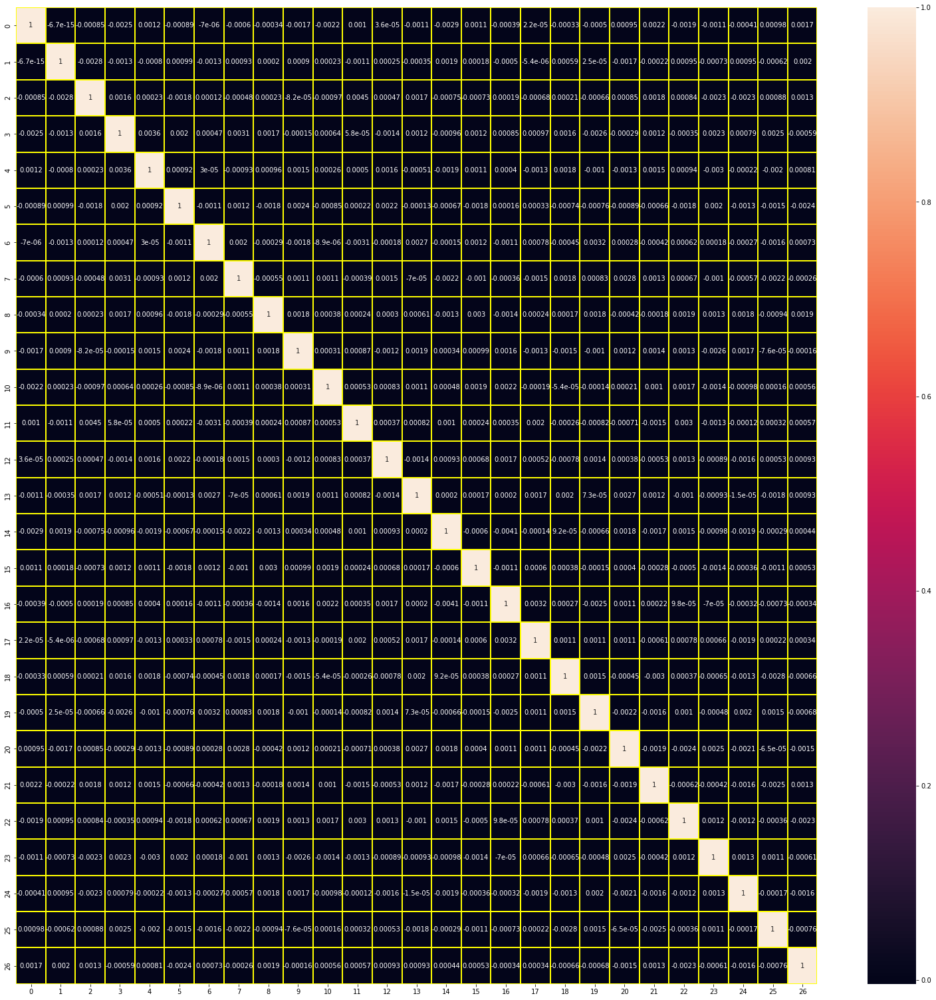

In [ ]:
plt.figure(figsize=(27,27))
sns.heatmap(data=df.corr(),annot=True,linewidths=2,linecolor="yellow")

In [ ]:
#treemap
!pip install squarify


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import squarify

In [ ]:
import sys

In [ ]:
print(sys.getrecursionlimit())

1000


In [ ]:
!pip install statsmodels

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [ ]:
df.dropna(axis=0)
df.head(10)

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,0,1.0,0.4337,0.7431,0.9390,0.7541,0.9035,0.7943,0.2622,0.5901,...,0.5696,0.6407,0.7027,0.7163,0.9954,0.8303,0.1641,0.7893,0.7533,0.2925
1,0,2.0,0.7859,0.1925,0.9024,0.8108,0.2016,0.9649,0.2445,0.8934,...,0.4259,0.7456,0.5750,0.7947,0.4663,0.4303,0.3643,0.0558,0.1330,0.0295
2,0,3.0,0.0512,0.9633,0.1423,0.8404,0.6654,0.4348,0.5751,0.8067,...,0.4753,0.5449,0.8531,0.6337,0.8807,0.2560,0.0597,0.5751,0.7797,0.8544
3,0,4.0,0.0413,0.1588,0.1675,0.0971,0.2918,0.1970,0.0971,0.2039,...,0.7959,0.5306,0.3109,0.2726,0.3298,0.4658,0.7479,0.8747,0.2677,0.3816
4,0,5.0,0.7042,0.4724,0.3901,0.2793,0.2522,0.1933,0.2694,0.4110,...,0.2474,0.5711,0.5686,0.6575,0.1447,0.5774,0.4022,0.6753,0.8371,0.6748
5,0,6.0,0.9538,0.3029,0.4227,0.7774,0.5194,0.7531,0.4816,0.9918,...,0.2433,0.2040,0.1013,0.6044,0.9570,0.8958,0.8006,0.5282,0.4132,0.4582
6,0,7.0,0.6729,0.9906,0.8604,0.2969,0.8278,0.4840,0.2507,0.0795,...,0.1682,0.7322,0.9347,0.0961,0.2847,0.4782,0.2882,0.4375,0.5795,0.8926
7,0,8.0,0.3945,0.4753,0.6420,0.9227,0.8885,0.1002,0.5443,0.8279,...,0.0176,0.2317,0.8063,0.4249,0.7711,0.4558,0.5419,0.4521,0.3392,0.6380
8,0,9.0,0.7368,0.8174,0.8750,0.1230,0.3970,0.7676,0.5175,0.8211,...,0.7746,0.0908,0.7100,0.7641,0.7748,0.9589,0.7818,0.9553,0.7653,0.1555
9,0,10.0,0.6752,0.1698,0.6974,0.1273,0.5090,0.3354,0.8128,0.2753,...,0.7912,0.1517,0.6923,0.7245,0.6380,0.0089,0.4479,0.6776,0.7189,0.2121


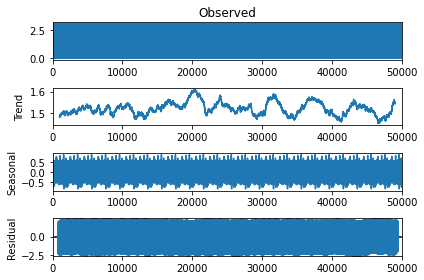

In [ ]:

result = seasonal_decompose(label.values, model = "additive",period = 2000)
result.plot()
plt.show()

In [ ]:
result = seasonal_decompose(label.values+1, model = "multiplicative")
result.plot()
plt.show()

ValueError: ignored

In [ ]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
count,550000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,...,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000,500000.000000
mean,22726.956349,5.500000,0.499646,0.500296,0.499995,0.500033,0.500318,0.500491,0.499761,0.499674,...,0.500060,0.500664,0.500395,0.500221,0.500455,0.499851,0.500049,0.499837,0.500127,0.500587
std,15525.428308,2.872284,0.288652,0.288496,0.288808,0.288599,0.288603,0.288693,0.288808,0.288567,...,0.288754,0.288270,0.288906,0.288865,0.288643,0.288304,0.288654,0.288483,0.288675,0.288442
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,8749.750000,3.000000,0.249900,0.250800,0.249400,0.250400,0.250900,0.250700,0.249700,0.249600,...,0.250300,0.251800,0.250000,0.249900,0.250600,0.250100,0.249800,0.250500,0.250400,0.251000
50%,22499.500000,5.500000,0.499600,0.499700,0.500400,0.500500,0.500100,0.500600,0.499600,0.499500,...,0.499750,0.500500,0.500600,0.500900,0.500300,0.500200,0.500100,0.499000,0.500300,0.501100
75%,36249.250000,8.000000,0.749400,0.750300,0.749925,0.749600,0.749800,0.750600,0.749900,0.749600,...,0.750500,0.750300,0.750900,0.750300,0.750500,0.749400,0.749800,0.749400,0.750400,0.750000
max,49999.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
!pip install sktime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 63.8 MB/s eta 0:00:00


(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='2'>)

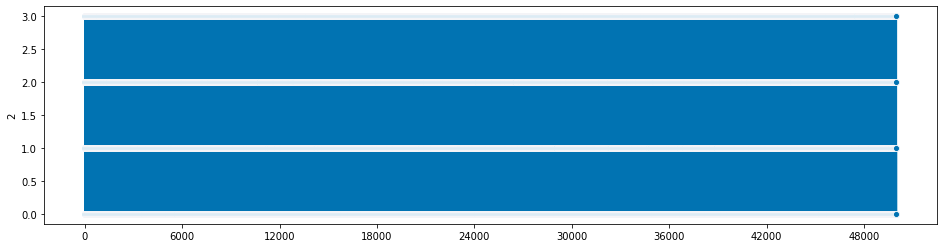

In [ ]:
import sktime
from sktime.utils.plotting import plot_series

plot_series(label)

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='3'>)

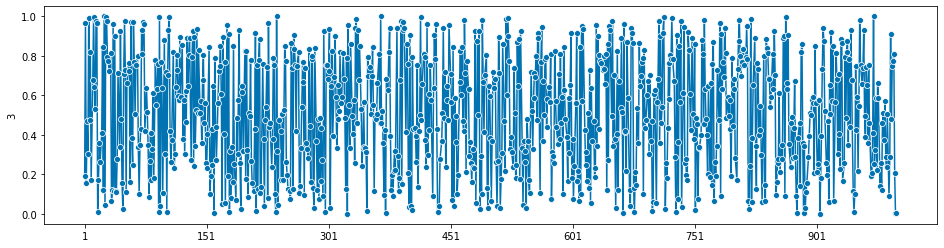

In [ ]:
plot_series(df.iloc[1:1000,3])

/usr/local/lib/python3.9/dist-packages/sktime/utils/plotting.py:113: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize=plt.figaspect(0.25))


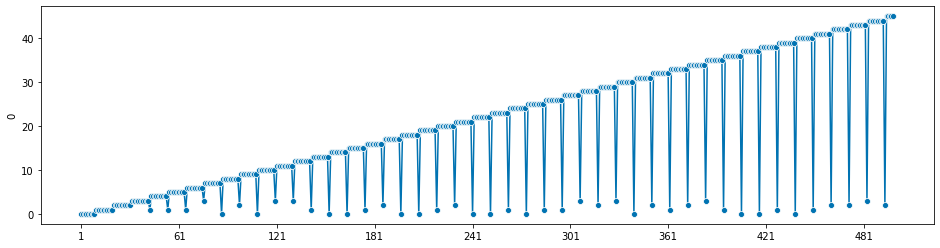

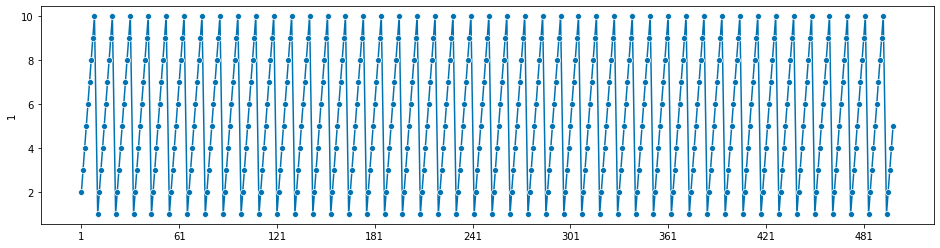

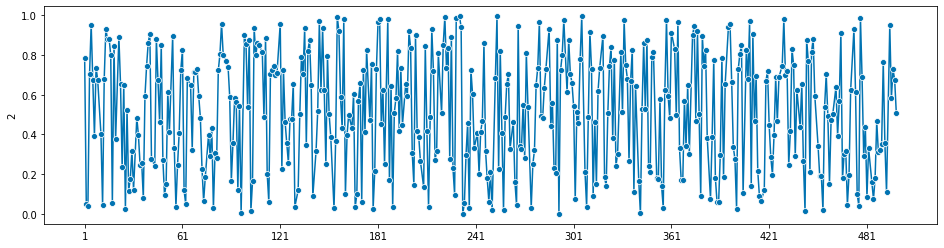

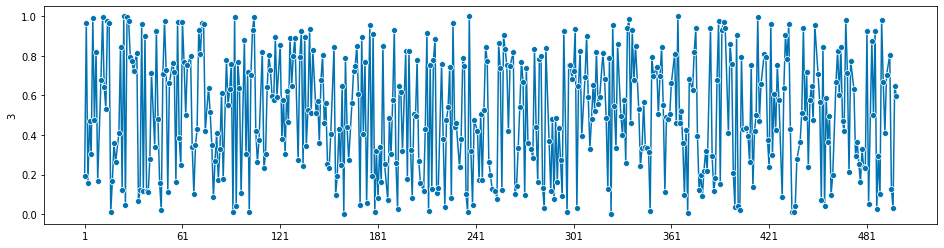

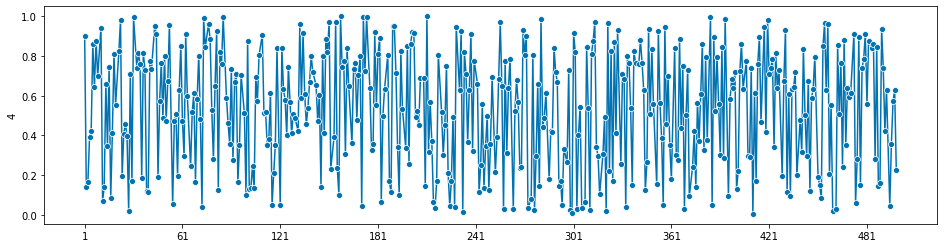

...

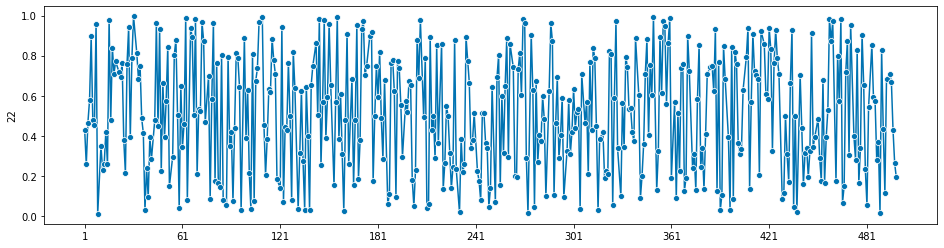

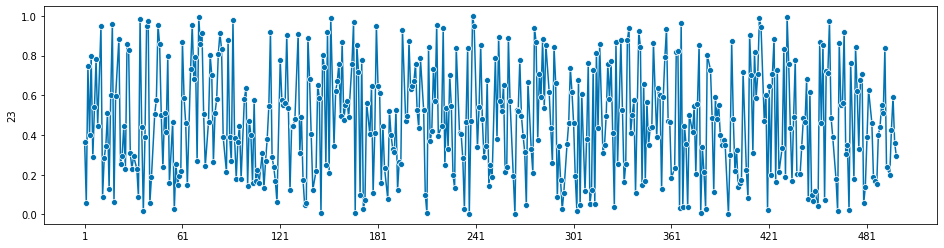

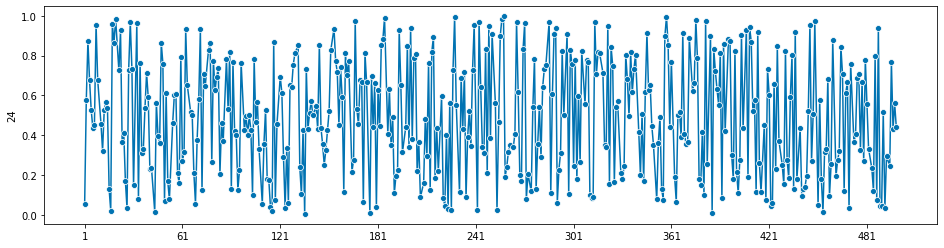

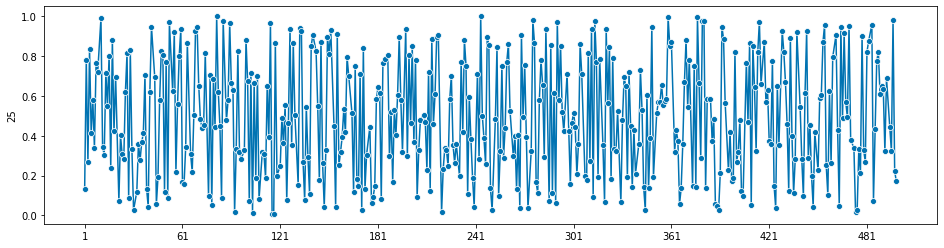

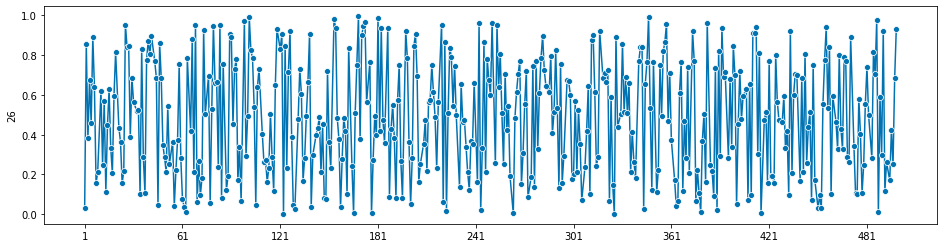

In [ ]:
for i in range(27):
  plot_series(df.iloc[1:500,i])

In [ ]:
from sktime.forecasting.var import VAR

In [ ]:
daf=df.dropna(axis=0)

In [ ]:
#zroorat nahi hai
#lawdapanti
forecaster = VAR()
forecaster.fit(daf,label,fh=[1, 2, 3])

y_pred = forecaster.predict()

/usr/local/lib/python3.9/dist-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


In [ ]:
y_pred

In [ ]:
!pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!pip install sktime[all_extras]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.0/178.0 KB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 217.2/217.2 KB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.9/228.9 KB 23.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 58.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 75.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 648.1/648.1 KB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 100.0/100.0 KB 12.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 KB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 92.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.2/136.2 

In [ ]:
import sklearn

In [ ]:
from sktime.classification.compose import TimeSeriesForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(daf, label)
classifier = TimeSeriesForestClassifier()
classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)
accuracy_score(y_test, y_pred)

ImportError: ignored

/usr/local/lib/python3.9/dist-packages/sktime/utils/plotting.py:113: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1, figsize=plt.figaspect(0.25))


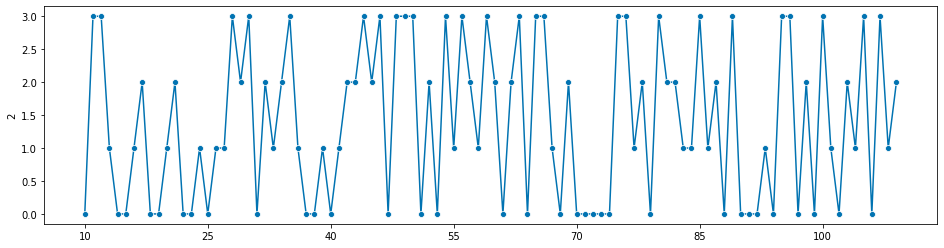

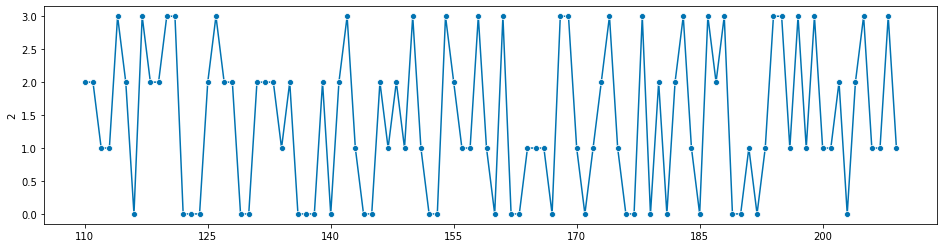

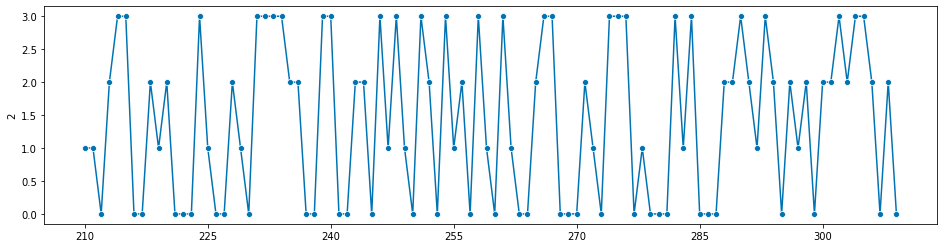

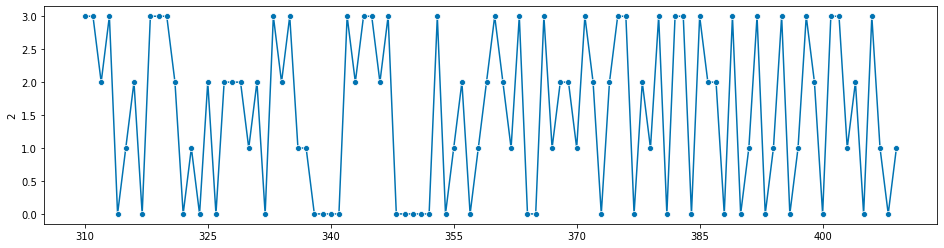

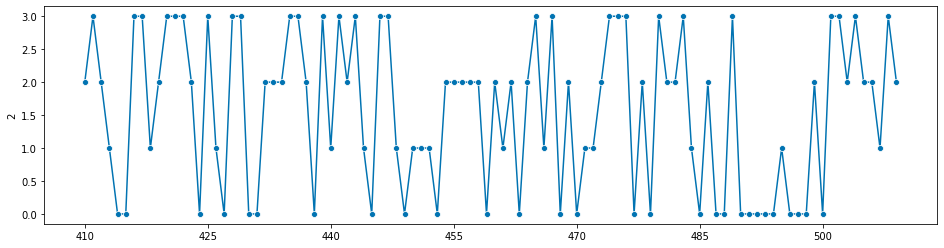

...

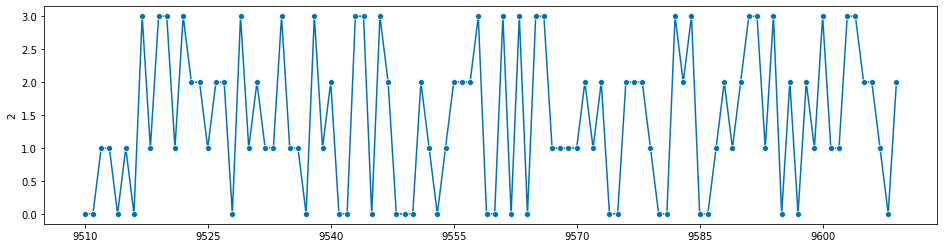

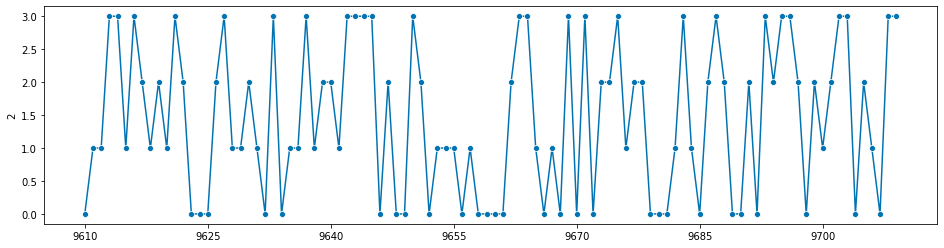

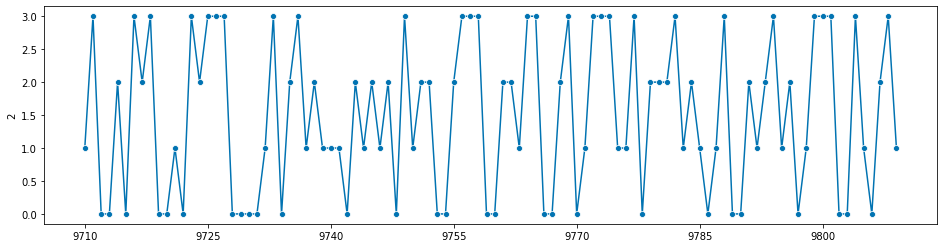

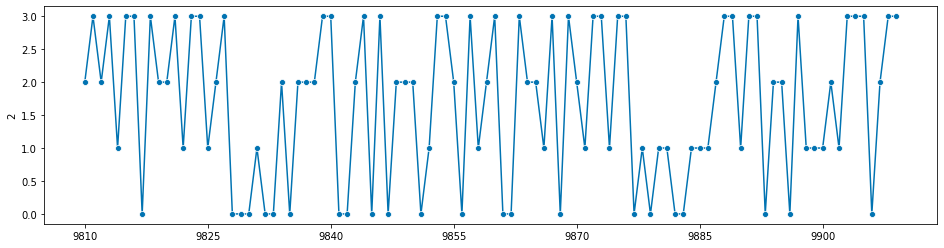

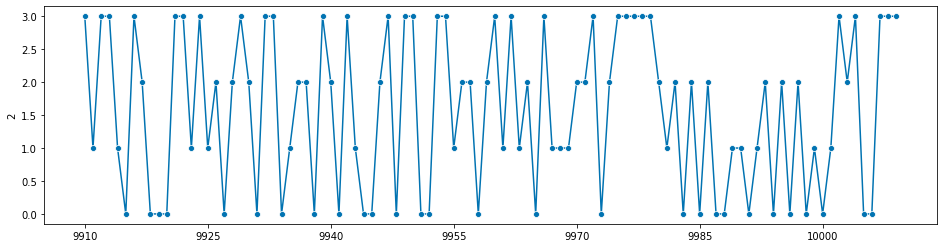

In [ ]:
for i in range(100):
  plot_series(label.iloc[100*i+10:110+100*i,])

<Figure size 7200x7200 with 0 Axes>

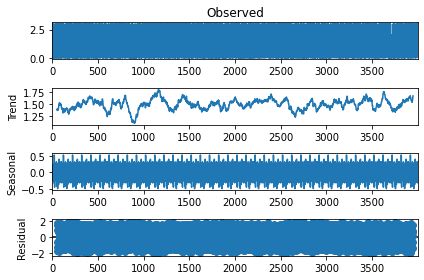

In [ ]:
plt.figure(figsize=(100,100))
result = seasonal_decompose(label.iloc[:4000,].values, model = "additive",period = 100)
result.plot()
plt.show()

<Figure size 7200x7200 with 0 Axes>

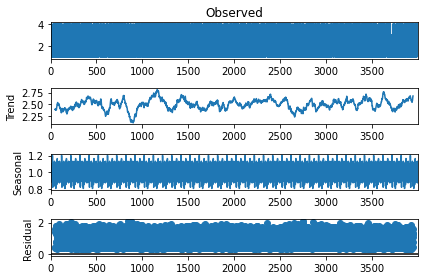

In [ ]:
plt.figure(figsize=(100,100))
result = seasonal_decompose(label.iloc[:4000,].values+1, model = "multiplicative",period = 100)
result.plot()
plt.show()

In [ ]:
x_train=label[:40000,]
x_test=label[40000:,]

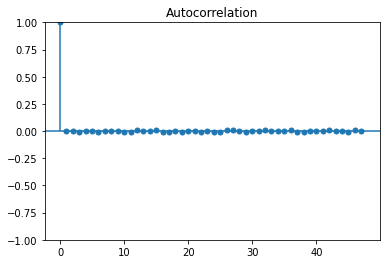

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

plot_acf(x_train);

/usr/local/lib/python3.9/dist-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


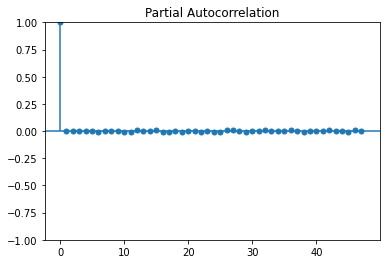

In [ ]:
plot_pacf(x_train);

In [ ]:
def sampling(sequence, n_steps):

  X, Y = list(), list()

  for i in range(len(sequence)):

    sam = i + n_steps
    if sam > len(sequence)-1:
      break

    x, y = sequence[i:sam], sequence[sam]

    X.append(x)

    Y.append(y)

  return np.array(X), np.array(Y)


In [ ]:
n_steps = 5

X, Y = sampling(x_train.tolist(), n_steps)

In [ ]:
from keras.models import Sequential
from keras.layers import LSTM
from keras.layers import Dense

model = Sequential()
model.add(LSTM(50, activation='softmax', input_shape=(n_steps, 1)))
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [ ]:
X = X.reshape((X.shape[0], X.shape[1], 1))

In [ ]:
X

array([[[1.],
        [1.],
        [2.],
        [3.],
        [1.]],

       [[1.],
        [2.],
        [3.],
        [1.],
        [1.]],

       [[2.],
        [3.],
        [1.],
        [1.],
        [1.]],

       ...,

       [[2.],
        [0.],
        [2.],
        [0.],
        [3.]],

       [[0.],
        [2.],
        [0.],
        [3.],
        [2.]],

       [[2.],
        [0.],
        [3.],
        [2.],
        [0.]]])

In [ ]:
Y

array([1., 1., 3., ..., 2., 0., 1.])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 50)                10400     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.fit(X, Y, epochs=15, verbose=1)


Epoch 1/15
1250/1250 [==============================] - 23s 14ms/step - loss: 1.9447
Epoch 2/15
1250/1250 [==============================] - 17s 14ms/step - loss: 1.3682
Epoch 3/15
1250/1250 [==============================] - 17s 14ms/step - loss: 1.3635
Epoch 4/15
1250/1250 [==============================] - 18s 14ms/step - loss: 1.3617
Epoch 5/15
1250/1250 [==============================] - 20s 16ms/step - loss: 1.3607
Epoch 6/15
1250/1250 [==============================] - 18s 14ms/step - loss: 1.3605
Epoch 7/15
1250/1250 [==============================] - 17s 14ms/step - loss: 1.3602
Epoch 8/15
1250/1250 [==============================] - 18s 14ms/step - loss: 1.3600
Epoch 9/15
1250/1250 [==============================] - 17s 14ms/step - loss: 1.3599
Epoch 10/15
1250/1250 [==============================] - 17s 14ms/step - loss: 1.3599
Epoch 11/15
1250/1250 [==============================] - 18s 14ms/step - loss: 1.3597
Epoch 12/15
1250/1250 [==============================] - 17s 13

In [ ]:
y_pred = model.predict(X,verbose=1)

1250/1250 [==============================] - 5s 4ms/step


In [ ]:
print(y_pred.shape)
print(Y.shape)
Y=pd.DataFrame(Y)
Y.shape

(39995, 1)
(39995,)


(39995, 1)

In [ ]:
from sklearn.metrics import

Instructions for updating:
Lambda fuctions will be no more assumed to be used in the statement where they are used, or at least in the same block. https://github.com/tensorflow/tensorflow/issues/56089


InvalidArgumentError: ignored

In [ ]:
print(result)

In [ ]:
model.compile(loss = 'mean_squared_error',
   optimizer = 'adam', metrics = [tf.keras.metrics.categorical_accuracy])

In [ ]:
Y

In [ ]:
x_=pd.DataFrame()

In [ ]:
df.head(50)

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,0,1.0,0.4337,0.7431,0.9390,0.7541,0.9035,0.7943,0.2622,0.5901,...,0.5696,0.6407,0.7027,0.7163,0.9954,0.8303,0.1641,0.7893,0.7533,0.2925
1,0,2.0,0.7859,0.1925,0.9024,0.8108,0.2016,0.9649,0.2445,0.8934,...,0.4259,0.7456,0.5750,0.7947,0.4663,0.4303,0.3643,0.0558,0.1330,0.0295
2,0,3.0,0.0512,0.9633,0.1423,0.8404,0.6654,0.4348,0.5751,0.8067,...,0.4753,0.5449,0.8531,0.6337,0.8807,0.2560,0.0597,0.5751,0.7797,0.8544
3,0,4.0,0.0413,0.1588,0.1675,0.0971,0.2918,0.1970,0.0971,0.2039,...,0.7959,0.5306,0.3109,0.2726,0.3298,0.4658,0.7479,0.8747,0.2677,0.3816
4,0,5.0,0.7042,0.4724,0.3901,0.2793,0.2522,0.1933,0.2694,0.4110,...,0.2474,0.5711,0.5686,0.6575,0.1447,0.5774,0.4022,0.6753,0.8371,0.6748
5,0,6.0,0.9538,0.3029,0.4227,0.7774,0.5194,0.7531,0.4816,0.9918,...,0.2433,0.2040,0.1013,0.6044,0.9570,0.8958,0.8006,0.5282,0.4132,0.4582
6,0,7.0,0.6729,0.9906,0.8604,0.2969,0.8278,0.4840,0.2507,0.0795,...,0.1682,0.7322,0.9347,0.0961,0.2847,0.4782,0.2882,0.4375,0.5795,0.8926
7,0,8.0,0.3945,0.4753,0.6420,0.9227,0.8885,0.1002,0.5443,0.8279,...,0.0176,0.2317,0.8063,0.4249,0.7711,0.4558,0.5419,0.4521,0.3392,0.6380
8,0,9.0,0.7368,0.8174,0.8750,0.1230,0.3970,0.7676,0.5175,0.8211,...,0.7746,0.0908,0.7100,0.7641,0.7748,0.9589,0.7818,0.9553,0.7653,0.1555
9,0,10.0,0.6752,0.1698,0.6974,0.1273,0.5090,0.3354,0.8128,0.2753,...,0.7912,0.1517,0.6923,0.7245,0.6380,0.0089,0.4479,0.6776,0.7189,0.2121


In [ ]:
daf=df.dropna(inplace=True)

In [ ]:
daf.head(20)

AttributeError: ignored

In [ ]:
df=df.iloc[:,2:27]

In [ ]:
df.head(10)

,2,3,4,5,6,7,8,9,10,11,...,17,18,19,20,21,22,23,24,25,26
0,0.4337,0.7431,0.9390,0.7541,0.9035,0.7943,0.2622,0.5901,0.7558,0.2675,...,0.5696,0.6407,0.7027,0.7163,0.9954,0.8303,0.1641,0.7893,0.7533,0.2925
1,0.7859,0.1925,0.9024,0.8108,0.2016,0.9649,0.2445,0.8934,0.9039,0.9474,...,0.4259,0.7456,0.5750,0.7947,0.4663,0.4303,0.3643,0.0558,0.1330,0.0295
2,0.0512,0.9633,0.1423,0.8404,0.6654,0.4348,0.5751,0.8067,0.3372,0.3346,...,0.4753,0.5449,0.8531,0.6337,0.8807,0.2560,0.0597,0.5751,0.7797,0.8544
3,0.0413,0.1588,0.1675,0.0971,0.2918,0.1970,0.0971,0.2039,0.3392,0.8863,...,0.7959,0.5306,0.3109,0.2726,0.3298,0.4658,0.7479,0.8747,0.2677,0.3816
4,0.7042,0.4724,0.3901,0.2793,0.2522,0.1933,0.2694,0.4110,0.3608,0.3153,...,0.2474,0.5711,0.5686,0.6575,0.1447,0.5774,0.4022,0.6753,0.8371,0.6748
5,0.9538,0.3029,0.4227,0.7774,0.5194,0.7531,0.4816,0.9918,0.0920,0.7097,...,0.2433,0.2040,0.1013,0.6044,0.9570,0.8958,0.8006,0.5282,0.4132,0.4582
6,0.6729,0.9906,0.8604,0.2969,0.8278,0.4840,0.2507,0.0795,0.9068,0.9769,...,0.1682,0.7322,0.9347,0.0961,0.2847,0.4782,0.2882,0.4375,0.5795,0.8926
7,0.3945,0.4753,0.6420,0.9227,0.8885,0.1002,0.5443,0.8279,0.9093,0.8412,...,0.0176,0.2317,0.8063,0.4249,0.7711,0.4558,0.5419,0.4521,0.3392,0.6380
8,0.7368,0.8174,0.8750,0.1230,0.3970,0.7676,0.5175,0.8211,0.3583,0.3890,...,0.7746,0.0908,0.7100,0.7641,0.7748,0.9589,0.7818,0.9553,0.7653,0.1555
9,0.6752,0.1698,0.6974,0.1273,0.5090,0.3354,0.8128,0.2753,0.1591,0.9358,...,0.7912,0.1517,0.6923,0.7245,0.6380,0.0089,0.4479,0.6776,0.7189,0.2121


In [ ]:
nparray=np.array(df)
print(nparray)

[[0.4337 0.7431 0.939  ... 0.7893 0.7533 0.2925]
 [0.7859 0.1925 0.9024 ... 0.0558 0.133  0.0295]
 [0.0512 0.9633 0.1423 ... 0.5751 0.7797 0.8544]
 ...
 [0.5622 0.7094 0.1205 ... 0.4906 0.7756 0.5428]
 [0.3565 0.4717 0.6521 ... 0.6706 0.1297 0.8826]
 [0.7871 0.2163 0.1643 ... 0.4489 0.4848 0.5125]]


In [ ]:
l=[]

for i in range(50000):
  l.extend(nparray[0+i*10:10+i*10].T)

In [ ]:
arr=np.array(l)
arr.shape

(1250000, 10)

In [ ]:
df2=pd.DataFrame(arr)
df2.shape

(1250000, 10)

In [ ]:
df2.head(30)

,0,1,2,3,4,5,6,7,8,9
0,0.4337,0.7859,0.0512,0.0413,0.7042,0.9538,0.6729,0.3945,0.7368,0.6752
1,0.7431,0.1925,0.9633,0.1588,0.4724,0.3029,0.9906,0.4753,0.8174,0.1698
2,0.9390,0.9024,0.1423,0.1675,0.3901,0.4227,0.8604,0.6420,0.8750,0.6974
3,0.7541,0.8108,0.8404,0.0971,0.2793,0.7774,0.2969,0.9227,0.1230,0.1273
4,0.9035,0.2016,0.6654,0.2918,0.2522,0.5194,0.8278,0.8885,0.3970,0.5090
5,0.7943,0.9649,0.4348,0.1970,0.1933,0.7531,0.4840,0.1002,0.7676,0.3354
6,0.2622,0.2445,0.5751,0.0971,0.2694,0.4816,0.2507,0.5443,0.5175,0.8128
7,0.5901,0.8934,0.8067,0.2039,0.4110,0.9918,0.0795,0.8279,0.8211,0.2753
8,0.7558,0.9039,0.3372,0.3392,0.3608,0.0920,0.9068,0.9093,0.3583,0.1591
9,0.2675,0.9474,0.3346,0.8863,0.3153,0.7097,0.9769,0.8412,0.3890,0.9358


<AxesSubplot:>

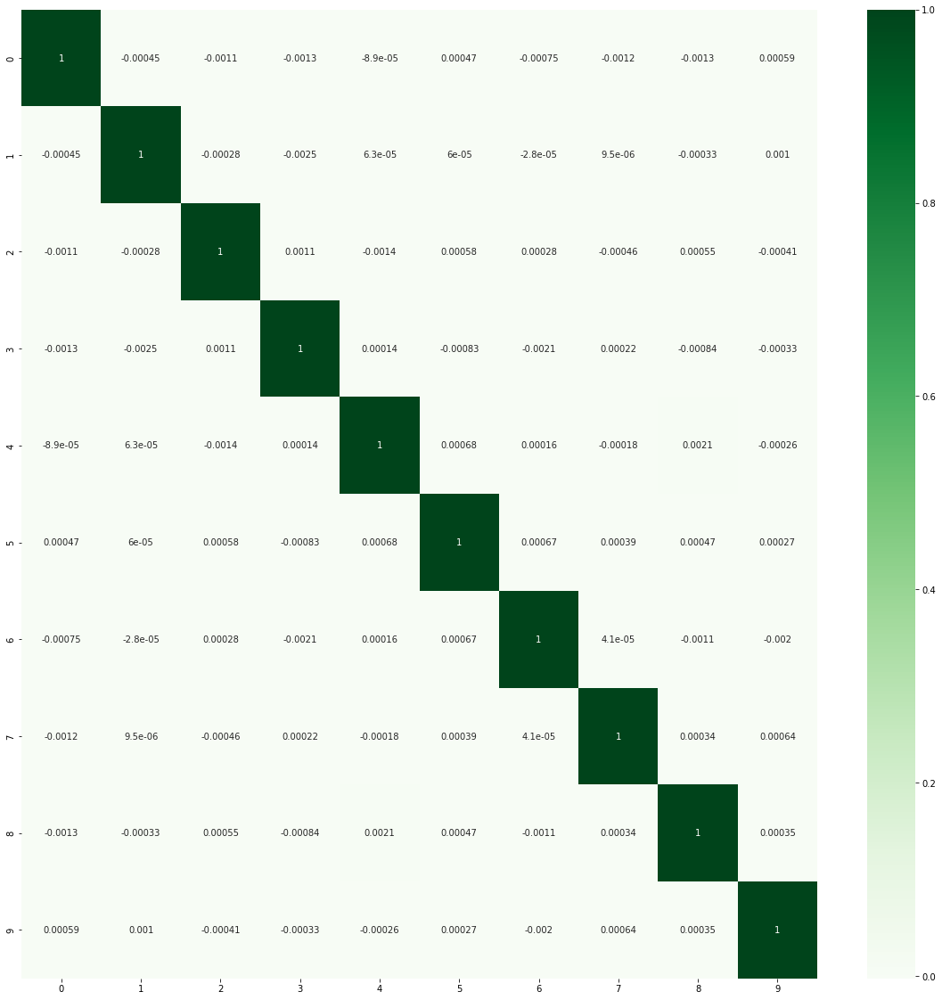

In [ ]:
plt.figure(figsize=(20,20))
sns.heatmap(data=df2.iloc[2:].corr(),annot=True,cmap='Greens')